In [1]:
import logging
import datetime
import pandas as pd
from pandas_ta import ema

from tradingstrategy.chain import ChainId
from tradingstrategy.timebucket import TimeBucket
from tradingstrategy.universe import Universe

from tradeexecutor.state.state import State
from tradeexecutor.state.trade import TradeExecution
from tradeexecutor.state.visualisation import PlotKind
from tradeexecutor.strategy.cycle import CycleDuration
from tradeexecutor.strategy.pandas_trader.position_manager import PositionManager
from tradeexecutor.strategy.pricing_model import PricingModel
from tradeexecutor.strategy.strategy_module import StrategyType, TradeRouting, ReserveCurrency

from typing import Optional, List, Dict
from tradeexecutor.strategy.trading_strategy_universe import load_pair_data_for_single_exchange, TradingStrategyUniverse
from tradeexecutor.strategy.execution_context import ExecutionContext
from tradingstrategy.client import Client

from tradeexecutor.strategy.universe_model import UniverseOptions

# Tell what trade execution engine version this strategy needs to use
# NOTE: this setting has currently no effect
TRADING_STRATEGY_ENGINE_VERSION = "0.1"

# What kind of strategy we are running.
# This tells we are going to use
# NOTE: this setting has currently no effect
TRADING_STRATEGY_TYPE = StrategyType.managed_positions

# How our trades are routed.
TRADE_ROUTING = TradeRouting.quickswap_usdc
# How often the strategy performs the decide_trades cycle.
# We do it for every 4h.
TRADING_STRATEGY_CYCLE = CycleDuration.cycle_1h

# Strategy keeps its cash in USDC
RESERVE_CURRENCY = ReserveCurrency.usdc

# Time bucket for our candles
CANDLE_TIME_BUCKET = TimeBucket.h1

# Which chain we are trading
CHAIN_ID = ChainId.polygon

# Which exchange we are trading on.
EXCHANGE_SLUG = "quickswap"

# Which trading pair we are trading
TRADING_PAIR = ("WMATIC", "USDC")

# How much of the cash to put on a single trade
POSITION_SIZE = 0.70

#
# Strategy thinking specific parameter
#

BATCH_SIZE = 90

SLOW_EMA_CANDLE_COUNT = 10
FAST_EMA_CANDLE_COUNT = 3


# Range of backtesting and synthetic data generation.
# Because we are using synthetic data actual dates do not really matter -
# only the duration

START_AT = datetime.datetime(2022, 1, 1)

END_AT = datetime.datetime(2022, 10, 18)

# Start with 10,000 USD
INITIAL_DEPOSIT = 10_000

# If the price drops 0.7% we trigger a stop loss
STOP_LOSS_PCT = 0.993

STOP_LOSS_TIME_BUCKET = TimeBucket.m15


logger = logging.getLogger(__name__)

In [2]:
def decide_trades(
        timestamp: pd.Timestamp,
        universe: Universe,
        state: State,
        pricing_model: PricingModel,
        cycle_debug_data: Dict) -> List[TradeExecution]:
    """The brain function to decide the trades on each trading strategy cycle.

    - Reads incoming execution state (positions, past trades)

    - Reads the current universe (candles)

    - Decides what trades to do next, if any, at current timestamp.

    - Outputs strategy thinking for visualisation and debug messages

    :param timestamp:
        The Pandas timestamp object for this cycle. Matches
        TRADING_STRATEGY_CYCLE division.
        Always truncated to the zero seconds and minutes, never a real-time clock.

    :param universe:
        Trading universe that was constructed earlier.

    :param state:
        The current trade execution state.
        Contains current open positions and all previously executed trades, plus output
        for statistics, visualisation and diangnostics of the strategy.

    :param pricing_model:
        Pricing model can tell the buy/sell price of the particular asset at a particular moment.

    :param cycle_debug_data:
        Python dictionary for various debug variables you can read or set, specific to this trade cycle.
        This data is discarded at the end of the trade cycle.

    :return:
        List of trade instructions in the form of :py:class:`TradeExecution` instances.
        The trades can be generated using `position_manager` but strategy could also hand craft its trades.
    """

    # The pair we are trading
    pair = universe.pairs.get_single()

    # How much cash we have in the hand
    cash = state.portfolio.get_current_cash()

    # Get OHLCV candles for our trading pair as Pandas Dataframe.
    # We could have candles for multiple trading pairs in a different strategy,
    # but this strategy only operates on single pair candle.
    # We also limit our sample size to N latest candles to speed up calculations.
    candles: pd.DataFrame = universe.candles.get_single_pair_data(timestamp, sample_count=BATCH_SIZE)

    # We have data for open, high, close, etc.
    # We only operate using candle close values in this strategy.
    close_prices = candles["close"]

    # Calculate exponential moving averages based on slow and fast sample numbers.
    slow_ema_series = ema(close_prices, length=SLOW_EMA_CANDLE_COUNT)
    fast_ema_series = ema(close_prices, length=FAST_EMA_CANDLE_COUNT)

    if slow_ema_series is None or fast_ema_series is None:
        # Cannot calculate EMA, because
        # not enough samples in backtesting
        logger.warning("slow_ema_series or fast_ema_series None")
        return []

    if len(slow_ema_series) < 2 or len(fast_ema_series) < 2:
        # We need at least two data points to determine if EMA crossover (or crossunder)
        # occurred at current timestamp.
        logger.warning("series too short")
        return []

    slow_ema_latest = slow_ema_series.iloc[-1]
    fast_ema_latest = fast_ema_series.iloc[-1]
    price_latest = close_prices.iloc[-1]

    # Compute technical indicators needed for trade decisions.
    slow_ema_crossover = (
            close_prices.iloc[-3] < slow_ema_series.iloc[-2]
            and price_latest > slow_ema_latest
    )
    slow_ema_crossunder = (
            close_prices.iloc[-2] > slow_ema_series.iloc[-2]
            and price_latest < slow_ema_latest
    )
    fast_ema_crossunder = (
            close_prices.iloc[-2] > fast_ema_series.iloc[-2]
            and price_latest < fast_ema_latest
    )

    trades = []

    # Create a position manager helper class that allows us easily to create
    # opening/closing trades for different positions
    position_manager = PositionManager(timestamp, universe, state, pricing_model)

    if not position_manager.is_any_open():
        # No open positions, decide if BUY in this cycle.
        # We buy if we just crossed over the slow EMA or if this is a very first
        # trading cycle and the price is already above the slow EMA.

        logger.trade("Starting a new trade")

        if (
                slow_ema_crossunder
                or price_latest < slow_ema_latest and timestamp == START_AT
        ):
            buy_amount = cash * POSITION_SIZE
            new_trades = position_manager.open_1x_long(pair, buy_amount, stop_loss_pct=STOP_LOSS_PCT)
            trades.extend(new_trades)
    else:

        logger.trade("Checking for close")

        # We have an open position, decide if SELL in this cycle.
        # We do that if we fall below any of the two moving averages.
        if slow_ema_crossover or (fast_ema_crossunder and fast_ema_latest > slow_ema_latest):
            new_trades = position_manager.close_all()
            assert len(new_trades) == 1
            trades.extend(new_trades)

    # Visualize strategy
    # See available Plotly colours here
    # https://community.plotly.com/t/plotly-colours-list/11730/3?u=miohtama
    visualisation = state.visualisation
    visualisation.plot_indicator(timestamp, "Slow EMA", PlotKind.technical_indicator_on_price, slow_ema_latest,
                                 colour="green")
    visualisation.plot_indicator(timestamp, "Fast EMA", PlotKind.technical_indicator_on_price, fast_ema_latest,
                                 colour="red")

    return trades

In [3]:
def create_trading_universe(
        ts: datetime.datetime,
        client: Client,
        execution_context: ExecutionContext,
        universe_options: UniverseOptions,
) -> TradingStrategyUniverse:

    dataset = load_pair_data_for_single_exchange(
        client,
        execution_context,
        CANDLE_TIME_BUCKET,
        CHAIN_ID,
        EXCHANGE_SLUG,
        [TRADING_PAIR],
        universe_options,
        stop_loss_time_bucket=STOP_LOSS_TIME_BUCKET,
    )

    # Filter down to the single pair we are interested in
    universe = TradingStrategyUniverse.create_single_pair_universe(
        dataset,
        CHAIN_ID,
        EXCHANGE_SLUG,
        TRADING_PAIR[0],
        TRADING_PAIR[1],
    )

    logger.warning("Universe created, we have %d pairs")

    return universe

In [4]:
from tradingstrategy.client import Client

client = Client.create_jupyter_client()

Started Trading Strategy in Jupyter notebook environment, configuration is stored in /home/alex/.tradingstrategy


In [5]:
from tradeexecutor.strategy.execution_context import ExecutionMode

universe = create_trading_universe(
    END_AT,
    client,
    ExecutionContext(mode=ExecutionMode.data_preload),
    universe_options=UniverseOptions()
)
print(f"We loaded {universe.universe.candles.get_candle_count():,} candles.")

Loading OHLCV data for WMATIC-USDC:   0%|          | 0/68646112 [00:00<?, ?it/s]

Loading granular price data for stop loss/take profit for quickswap:   0%|          | 0/68646117 [00:00<?, ?it…

Universe created, we have %d pairs


We loaded 18,314 candles.


In [6]:
import logging

from tradeexecutor.backtest.backtest_runner import run_backtest_inline

state, universe, debug_dump = run_backtest_inline(
    name="ETH/USDC fast and slow EMA example",
    start_at=START_AT,
    end_at=END_AT,
    client=client,
    cycle_duration=TRADING_STRATEGY_CYCLE,
    decide_trades=decide_trades,
    universe=universe,
    # create_trading_universe=create_single_pair_trading_universe,
    initial_deposit=INITIAL_DEPOSIT,
    reserve_currency=RESERVE_CURRENCY,
    trade_routing=TRADE_ROUTING,
    log_level=logging.WARNING,
)

trade_count = len(list(state.portfolio.get_all_trades()))
print(f"Backtesting completed, backtested strategy made {trade_count} trades")

  0%|          | 0/25056000 [00:00<?, ?it/s]

Backtesting completed, backtested strategy made 1164 trades


In [7]:
print(f"Positions taken: {len(list(state.portfolio.get_all_positions()))}")
print(f"Trades made: {len(list(state.portfolio.get_all_trades()))}")

Positions taken: 582
Trades made: 1164


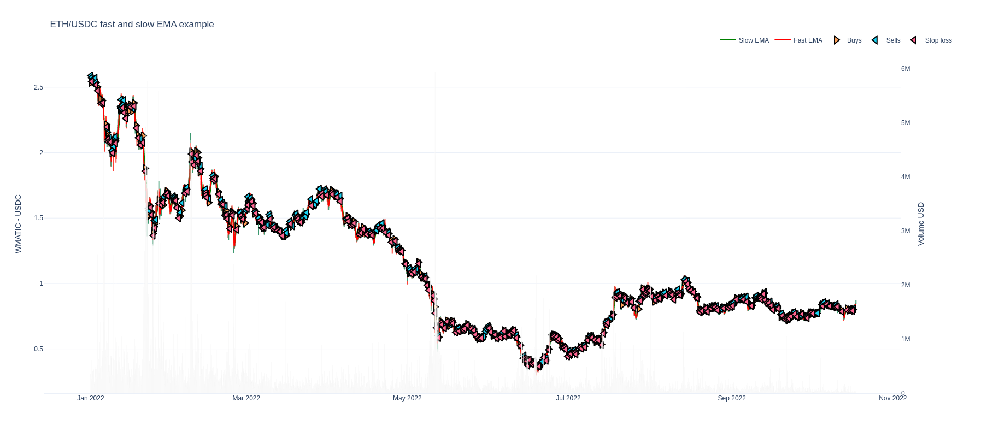

In [8]:
from tradeexecutor.visual.single_pair import visualise_single_pair

figure = visualise_single_pair(
    state,
    universe.universe.candles,
    start_at=START_AT,
    end_at=END_AT)

figure.show()

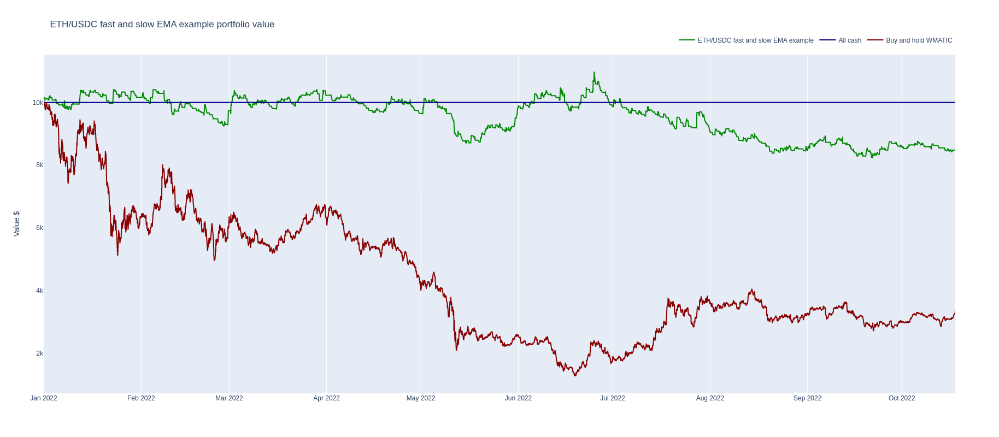

In [11]:
from tradeexecutor.visual.benchmark import visualise_benchmark

traded_pair = universe.universe.pairs.get_single()

fig = visualise_benchmark(
    state.name,
    portfolio_statistics=state.stats.portfolio,
    all_cash=state.portfolio.get_initial_deposit(),
    buy_and_hold_asset_name=traded_pair.base_token_symbol,
    buy_and_hold_price_series=universe.universe.candles.get_single_pair_data()["close"],
    start_at=START_AT,
    end_at=END_AT,
    height=800
)

fig.show()

In [12]:
from tradeexecutor.analysis.trade_analyser import build_trade_analysis

analysis = build_trade_analysis(state.portfolio)

In [13]:
from IPython.core.display_functions import display

summary = analysis.calculate_summary_statistics()

with pd.option_context("display.max_row", None):
    display(summary.to_dataframe())

,0
Trading period length,289 days
Return %,-15.22%
Annualised return %,-19.21%
Cash at start,"$10,000.00"
Value at end,"$8,477.97"
Trade win percent,45.36%
Total trades done,582
Won trades,264
Lost trades,318
Stop losses triggered,314


In [14]:
from tradeexecutor.analysis.trade_analyser import expand_timeline

timeline = analysis.create_timeline()

expanded_timeline, apply_styles = expand_timeline(
        universe.universe.exchanges,
        universe.universe.pairs,
        timeline)

# Do not truncate the row output
with pd.option_context("display.max_row", None):
    display(apply_styles(expanded_timeline))

Remarks,Opened at,Duration,Exchange,Base asset,Quote asset,Position max size,PnL USD,PnL %,Open price USD,Close price USD,Trade count
,2022-01-01,2 hours,Quickswap,WMATIC,USDC,"$7,148.65",$148.65,2.12%,$2.535133,$2.588969,2
,2022-01-01,2 hours,Quickswap,WMATIC,USDC,"$7,129.09",$25.03,0.35%,$2.563973,$2.573008,2
SL,2022-01-01,1 hours 45 mins,Quickswap,WMATIC,USDC,"$7,121.58",$-63.43,-0.89%,$2.567152,$2.544287,2
,2022-01-01,2 hours,Quickswap,WMATIC,USDC,"$7,085.02",$7.84,0.11%,$2.561370,$2.564207,2
,2022-01-02,6 hours,Quickswap,WMATIC,USDC,"$7,167.93",$85.26,1.20%,$2.539484,$2.570055,2
,2022-01-02,4 hours,Quickswap,WMATIC,USDC,"$7,148.65",$6.30,0.09%,$2.534278,$2.536512,2
SL,2022-01-03,45 mins,Quickswap,WMATIC,USDC,"$7,146.76",$-52.37,-0.73%,$2.536178,$2.517592,2
SL,2022-01-03,2 hours,Quickswap,WMATIC,USDC,"$7,110.10",$-84.15,-1.18%,$2.502737,$2.473117,2
SL,2022-01-04,4 hours 45 mins,Quickswap,WMATIC,USDC,"$7,051.20",$-102.14,-1.45%,$2.411602,$2.376670,2
SL,2022-01-05,5 hours 30 mins,Quickswap,WMATIC,USDC,"$6,979.70",$-49.45,-0.71%,$2.398540,$2.381548,2
